### Import required libraries

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
from glob import glob
from IPython.display import Image
from pathlib import Path
import pandas as pd
from shutil import copyfile
from sklearn.model_selection import train_test_split
from xml.dom.minidom import parse
from google.colab import files

#### Get Kaggle Dataset

In [ ]:
def get_kaggle_dataset(dataset_name, extract_to_folder=False, is_competition=False):
    # Upload kaggle.json if not already uploaded
    if not(os.path.exists("kaggle.json")):
        files.upload()  # Upload kaggle.json

    # Install and configure Kaggle CLI
    !pip install --upgrade --force-reinstall --no-deps kaggle
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle
    !chmod 600 /root/.kaggle/kaggle.json

    # Download dataset
    if is_competition:
        !kaggle competitions download -c {dataset_name}
    else:
        dataset_url = dataset_name
        dataset_name = dataset_url.split("/")[1]
        !kaggle datasets download -d {dataset_url}

    # Extract dataset if required
    if extract_to_folder:
        !mkdir {dataset_name}
        !unzip -q {dataset_name}.zip -d {dataset_name}
    else:
        !unzip -q {dataset_name}.zip

    # Remove zip file
    !rm -f {dataset_name}.zip

    # List files in current directory
    !ls

In [ ]:
# get the dataset
get_kaggle_dataset("andrewmvd/hard-hat-detection")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.7/79.7 kB 1.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for kaggle: filename=kaggle-1.6.12-py3-none-any.whl size=102969 sha256=5951ddeaf308f6b236956eeafe5b5cd718ddcbe9419b0ad35462d7b70c9018b1
  Stored in directory: /root/.cache/pip/wheels/1e/0b/7c/50f8e89c3d2f82838dbd7afeddffbb9357003009ada98216c7
Successfully built kaggle
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.5.16
    Uninstalling kaggle-1.5.16:
      Successfully uninstalled kaggle-1.5.16
cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
Dataset URL: https://www.kaggle.com/datasets/andrewmvd/hard-hat-detection
License(s): CC0-1.0
100% 1.22G/1.22G [01:08<00:00, 11.4MB/s]
100% 1.22G/1.22G [01:08<00:00, 19.3MB/s]
annotations  images  sample_data


In [ ]:
!ls /content/

annotations  images  sample_data


#### Specify Directories and Classes

In [ ]:
!mkdir -p dataset/labels
!mkdir -p dataset/images
!ls

annotations  dataset  images  sample_data


In [ ]:
classes = [
    'helmet',
    'head',
    'person',
]

#### Define Helper Functions

In [ ]:
def convert_annotation_to_yolo_format(image_size, box_coordinates):
    """
    Convert bounding box coordinates to YOLO format.

    Args:
        image_size (tuple): Size of the image (width, height).
        box_coordinates (tuple): Coordinates of the bounding box (x1, y1, x2, y2).

    Returns:
        list: Converted bounding box coordinates in YOLO format [x_center, y_center, width, height].
    """
    # Unpack box coordinates
    x1, y1, x2, y2 = box_coordinates

    # Unpack image size
    image_width, image_height = image_size

    # Calculate width and height ratios
    width_ratio = np.float32(1. / int(image_width))
    height_ratio = np.float32(1. / int(image_height))

    # Calculate box width and height
    box_width = x2 - x1
    box_height = y2 - y1

    # Calculate center coordinates
    x_center = x1 + (box_width / 2)
    y_center = y1 + (box_height / 2)

    # Normalize coordinates
    x_center_normalized = x_center * width_ratio
    box_width_normalized = box_width * width_ratio
    y_center_normalized = y_center * height_ratio
    box_height_normalized = box_height * height_ratio

    # Print normalized coordinates
    print("Normalized coordinates:")
    print(f"x_center_normalized: {x_center_normalized}, y_center_normalized: {y_center_normalized}, "
          f"box_width_normalized: {box_width_normalized}, box_height_normalized: {box_height_normalized}")

    # Return YOLO format bounding box coordinates
    return [x_center_normalized, y_center_normalized, box_width_normalized, box_height_normalized]


In [ ]:
def save_annotation_txt_file(image_filename, image_size, bounding_boxes):
    # Define the annotation file path
    annotation_file_path = 'dataset/labels/' + image_filename + '.txt'
    print("Annotation file path:", annotation_file_path)

    # Open the annotation file in append mode
    with open(annotation_file_path, 'a+') as annotation_file:
        # Iterate over each bounding box
        for box in bounding_boxes:
            # Get the class index from the class name
            class_index = classes.index(box[0])

            # Convert bounding box coordinates to YOLO format
            converted_box = convert_annotation_to_yolo_format(image_size, box[1:])

            # Write the YOLO format bounding box to the annotation file
            annotation_file.write(f"{class_index} {converted_box[0]} {converted_box[1]} "
                                   f"{converted_box[2]} {converted_box[3]}\n")

        # Flush and close the annotation file
        annotation_file.flush()
        annotation_file.close()

In [ ]:
def parse_xml_annotation_and_save(file_folder_path, image_xml_filename):
    """
    Parse XML annotation file and save bounding box annotations in YOLO format.

    Args:
        file_folder_path (str): Path to the folder containing XML annotation files.
        image_xml_filename (str): Name of the XML annotation file (without extension).
    """
    # Construct the path to the XML annotation file
    xml_file_path = file_folder_path + '/' + image_xml_filename + '.xml'

    # Parse the XML file
    dom = parse(xml_file_path)
    root = dom.documentElement

    # Extract image information
    image_name = root.getElementsByTagName("filename")[0].childNodes[0].data
    image_size_node = root.getElementsByTagName("size")[0]
    image_width = image_size_node.getElementsByTagName("width")[0].childNodes[0].data
    image_height = image_size_node.getElementsByTagName("height")[0].childNodes[0].data
    image_depth = image_size_node.getElementsByTagName("depth")[0].childNodes[0].data

    # Extract bounding box annotations
    bounding_boxes = []
    for obj in root.getElementsByTagName("object"):
        class_name = obj.getElementsByTagName("name")[0].childNodes[0].data
        x1 = int(obj.getElementsByTagName("xmin")[0].childNodes[0].data)
        y1 = int(obj.getElementsByTagName("ymin")[0].childNodes[0].data)
        x2 = int(obj.getElementsByTagName("xmax")[0].childNodes[0].data)
        y2 = int(obj.getElementsByTagName("ymax")[0].childNodes[0].data)

        # Append bounding box information to the list
        bounding_boxes.append([class_name, x1, y1, x2, y2])

    # Save bounding box annotations in YOLO format
    save_annotation_txt_file(image_xml_filename, [image_width, image_height], bounding_boxes)


In [ ]:
!ls /content/dataset/labels

In [ ]:
# Get list of XML files in the annotations folder
xml_files = os.listdir('annotations')

# Iterate over each XML file
print("Starting XML files iterations...")
for xml_file in xml_files:
    # print("XML file name: ", xml_file)

    # Extract the filename without extension
    xml_filename = xml_file.split(".")[0]
    print("\tXML filename: ", xml_filename)

    # Parse XML annotation and save in YOLO format
    try:
      parse_xml_annotation_and_save('annotations', xml_filename)
    except:
      print("Passed", xml_filename)
      pass
print("Completed!")

Streaming output truncated to the last 5000 lines.
x_center_normalized: 0.43269232381135225, y_center_normalized: 0.04687500174622983, box_width_normalized: 0.1586538520641625, box_height_normalized: 0.09375000349245965
Normalized coordinates:
x_center_normalized: 0.5685096365632489, y_center_normalized: 0.042067309259437025, box_width_normalized: 0.12259615841321647, box_height_normalized: 0.08413461851887405
	XML filename:  hard_hat_workers3340
Annotation file path: dataset/labels/hard_hat_workers3340.txt
Normalized coordinates:
x_center_normalized: 0.5360577122773975, y_center_normalized: 0.383413475821726, box_width_normalized: 0.07211538730189204, box_height_normalized: 0.07451923354528844
Normalized coordinates:
x_center_normalized: 0.4675480943406001, y_center_normalized: 0.44951924751512706, box_width_normalized: 0.06490384857170284, box_height_normalized: 0.06250000232830644
	XML filename:  hard_hat_workers1082
Annotation file path: dataset/labels/hard_hat_workers1082.txt
Norm

In [ ]:
# Get list of image files
image_files = os.listdir('images')

# Split the image files into train, validation, and test sets
train_files, test_val_files = train_test_split(image_files, test_size=0.2, random_state=42)
val_files, test_files = train_test_split(test_val_files, test_size=0.5, random_state=42)

# Output the information about the dataset
total_images = image_files
train_images = train_files
val_images = val_files
test_images = test_files

print('Total images:', len(total_images))
print('Train images:', len(train_images))
print('Validation images:', len(val_images))
print('Test images:', len(test_images))


Total images: 5000
Train images: 4000
Validation images: 500
Test images: 500


In [ ]:
def copy_images_and_labels(file_list, label_root_path, image_source_path, mode):
    # Create directories if they do not exist
    image_dest_path = Path('dataset/images/' + mode)
    if not image_dest_path.exists():
        print(f"Directory {image_dest_path} does not exist. Creating...")
        os.makedirs(image_dest_path)

    label_dest_path = Path('dataset/labels/' + mode)
    if not label_dest_path.exists():
        print(f"Directory {label_dest_path} does not exist. Creating...")
        os.makedirs(label_dest_path)

    # Copy image and label files
    for file in file_list:
        image_name = file.replace('.png', '')
        image_src_file = image_source_path + '/' + image_name + '.png'
        label_src_file = label_root_path + '/' + image_name + '.txt'

        # Copy image
        image_dest_file = image_dest_path / (image_name + '.png')
        copyfile(image_src_file, image_dest_file)

        # Copy label
        label_dest_file = label_dest_path / (image_name + '.txt')
        copyfile(label_src_file, label_dest_file)



In [ ]:
copy_images_and_labels(train_images, 'dataset/labels', 'images', 'train')
copy_images_and_labels(val_images, 'dataset/labels', 'images', 'val')
copy_images_and_labels(test_images, 'dataset/labels', 'images', 'test')

Directory dataset/images/train does not exist. Creating...
Directory dataset/labels/train does not exist. Creating...
Directory dataset/images/val does not exist. Creating...
Directory dataset/labels/val does not exist. Creating...
Directory dataset/images/test does not exist. Creating...
Directory dataset/labels/test does not exist. Creating...


In [ ]:
!ls dataset/images

test  train  val


# **YOLO v5 Model:**

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16567, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (32/32), done.
remote: Total 16567 (delta 23), reused 31 (delta 13), pack-reused 16522
Receiving objects: 100% (16567/16567), 15.08 MiB | 9.19 MiB/s, done.
Resolving deltas: 100% (11380/11380), done.
/content/yolov5


In [ ]:
!ls

benchmarks.py	 data	     LICENSE	     README.zh-CN.md   tutorial.ipynb
CITATION.cff	 detect.py   models	     requirements.txt  utils
classify	 export.py   pyproject.toml  segment	       val.py
CONTRIBUTING.md  hubconf.py  README.md	     train.py


**create yaml file for configuration**

In [ ]:
import yaml

dict_file = {
    'train':'/content/dataset/images/train' ,
    'val': '/content/dataset/images/val',
    'nc' : '3',
    'names' : [
        'helmet',
        'head',
        'person',
        ]
    }

with open('/content/yolov5/data/hard_head.yaml', 'w+') as file:
    documents = yaml.dump(dict_file, file)

In [ ]:
!python train.py --img 416 --batch 32 --epochs 30 --data data/hard_head.yaml --cfg models/yolov5l.yaml --weights yolov5l.pt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 752.1/752.1 kB 21.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-man

In [ ]:
!python val.py --data data/hard_head.yaml --weights /content/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.25

val: data=data/hard_head.yaml, weights=['/content/yolov5/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.25, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.25 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-304-g22361691 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5l summary: 267 layers, 46119048 parameters, 0 gradients, 107.7 GFLOPs
val: Scanning /content/dataset/labels/val.cache... 500 images, 0 backgrounds, 0 corrupt: 100% 500/500 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Cla

# **SAHI INFERENCE:**

In [ ]:
!pip install -U torch sahi yolov5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.1/779.1 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.4/953.4 kB 76.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.2/176.2 MB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.1/168.1 MB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.8/61.8 MB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.4/88.4 kB 12.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 18.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 85.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.2/82.2 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 k

In [ ]:
import os
os.getcwd()

'/content'

In [ ]:
# arrange an instance segmentation model for test
from sahi.utils.yolov5 import (
    download_yolov5s6_model,
)

# import required functions, classes
from sahi import AutoDetectionModel
from sahi.utils.cv import read_image
from sahi.utils.file import download_from_url
from sahi.predict import get_prediction, get_sliced_prediction, predict
from IPython.display import Image

## **Function 1: Display Random Images with Predictions on Yolov5**

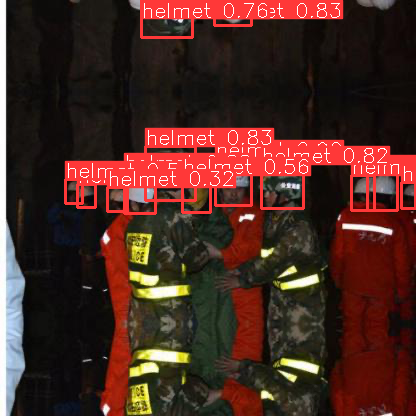

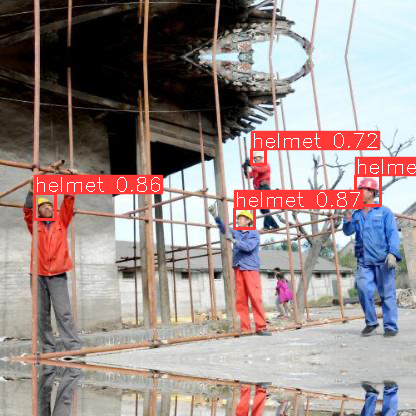

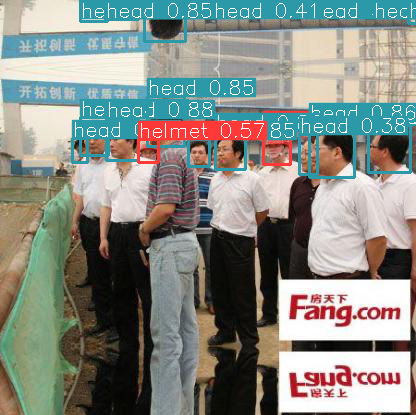

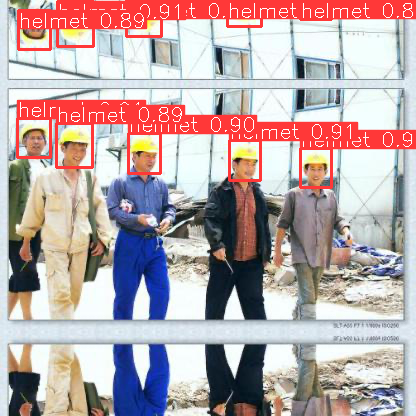

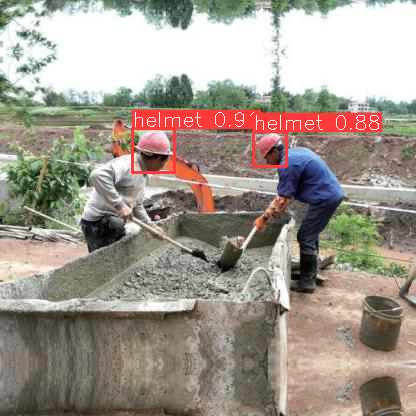

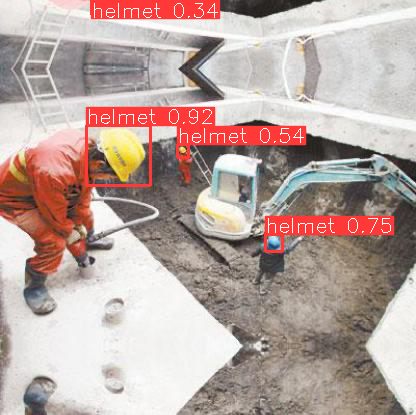

In [ ]:
import os
import random
from sahi import AutoDetectionModel
from sahi.utils.cv import read_image
from sahi.predict import get_prediction
from IPython.display import Image, display

def get_shared_image_files(images_directory, num_images=6):
    """
    Get a list of image files from a directory.

    Parameters:
        images_directory (str): Path to the directory containing images.
        num_images (int): Number of images to select. Default is 6.

    Returns:
        list: A list of selected image files.
    """
    image_files = os.listdir(images_directory)
    return image_files[:num_images]

def display_random_images_with_predictions(image_files, images_directory, detection_model):
    """
    Display random images from a directory along with their predictions.

    Parameters:
        image_files (list): List of image files to display.
        images_directory (str): Path to the directory containing images.
        detection_model (AutoDetectionModel): Detection model instance.
    """
    for image_file in image_files:
        image_path = os.path.join(images_directory, image_file)
        result = get_prediction(image_path, detection_model)
        result.export_visuals(export_dir="demo_data/")
        display(Image("demo_data/prediction_visual.png"))

# Define YOLOv5 model path
yolov5_model_path = '/content/yolov5/runs/train/exp/weights/best.pt'

# Initialize the detection model
detection_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=yolov5_model_path,
    confidence_threshold=0.3,
    device="cpu",  # or 'cuda:0'
)

# Path to the directory containing images
images_directory = '/content/dataset/images/val'

# Get the shared list of image files
image_files = get_shared_image_files(images_directory)

# Example usage:
display_random_images_with_predictions(image_files, images_directory, detection_model)


## **Function 2: Display Sliced Images with SAHI YOLOV5 Predictions**

Performing prediction on 4 number of slices.


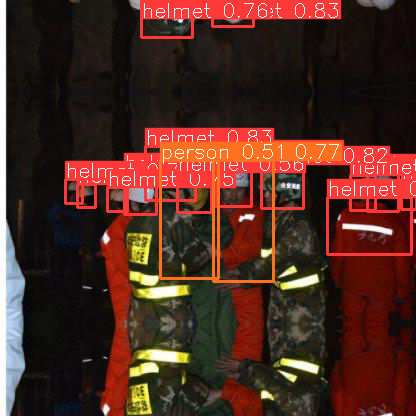

Performing prediction on 4 number of slices.


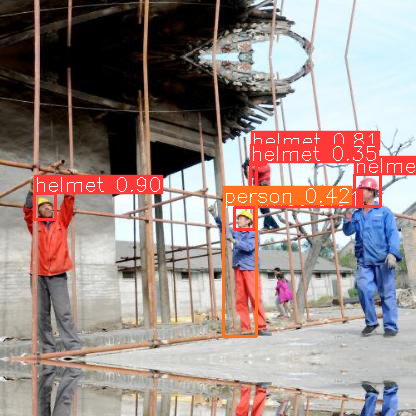

Performing prediction on 4 number of slices.


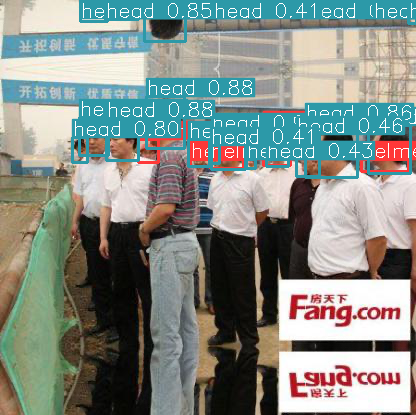

Performing prediction on 4 number of slices.


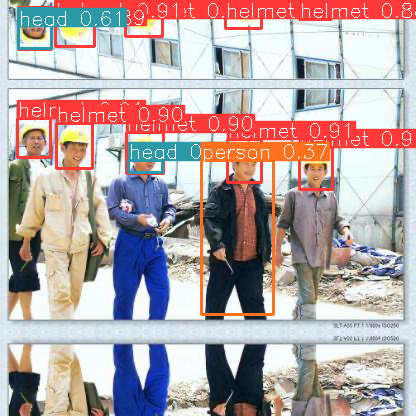

Performing prediction on 4 number of slices.


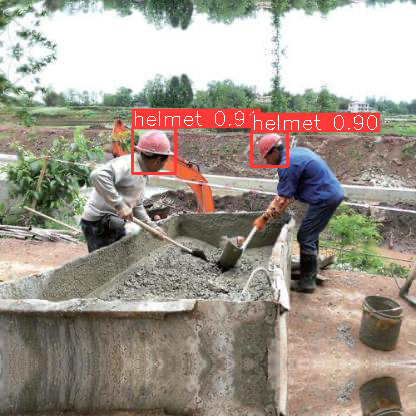

Performing prediction on 4 number of slices.


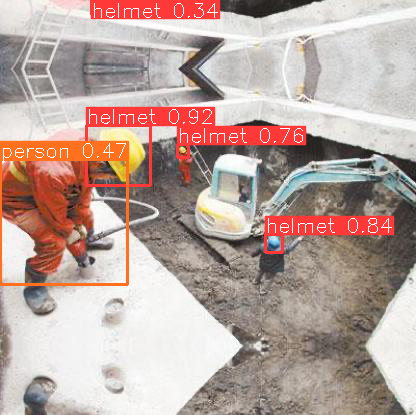

In [ ]:
import os
import random
from sahi import AutoDetectionModel
from sahi.utils.cv import read_image
from sahi.predict import get_sliced_prediction
from IPython.display import Image, display

def get_shared_image_files(images_directory, num_images=6):
    """
    Get a list of image files from a directory.

    Parameters:
        images_directory (str): Path to the directory containing images.
        num_images (int): Number of images to select. Default is 6.

    Returns:
        list: A list of selected image files.
    """
    image_files = os.listdir(images_directory)
    return image_files[:num_images]

def display_sliced_images_with_predictions(image_files, images_directory, detection_model):
    """
    Display images from a directory along with their predictions using sliced prediction.

    Parameters:
        image_files (list): List of image files to display.
        images_directory (str): Path to the directory containing images.
        detection_model (AutoDetectionModel): Detection model instance.
    """
    for image_file in image_files:
        image_path = os.path.join(images_directory, image_file)
        result = get_sliced_prediction(
            image_path,
            detection_model,
            slice_height=256,
            slice_width=256,
            overlap_height_ratio=0.1,
            overlap_width_ratio=0.1
        )
        result.export_visuals(export_dir="demo_data/")
        display(Image("demo_data/prediction_visual.png"))

# Define YOLOv5 model path
yolov5_model_path = '/content/yolov5/runs/train/exp/weights/best.pt'

# Initialize the detection model
detection_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=yolov5_model_path,
    confidence_threshold=0.3,
    device="cpu",  # or 'cuda:0'
)

# Path to the directory containing images
images_directory = '/content/dataset/images/val'

# Get the shared list of image files
image_files = get_shared_image_files(images_directory)

# Example usage:
display_sliced_images_with_predictions(image_files, images_directory, detection_model)


# **TESTING THE MODEL WITH RANDOM IMAGE**

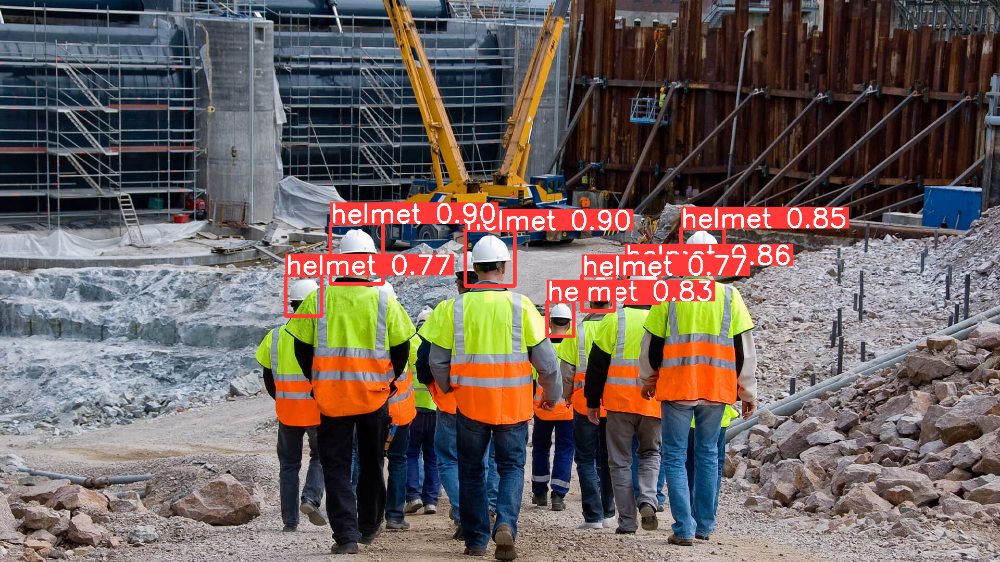

In [ ]:
import os
from sahi import AutoDetectionModel
from sahi.predict import get_prediction
from IPython.display import Image, display

def display_image_with_predictions(image_path, detection_model):
    """
    Display an image along with its predictions.

    Parameters:
        image_path (str): Path to the image file.
        detection_model (AutoDetectionModel): Detection model instance.
    """
    result = get_prediction(image_path, detection_model)
    result.export_visuals(export_dir="demo_data/")
    display(Image("demo_data/prediction_visual.png"))

# Define YOLOv5 model path
yolov5_model_path = '/content/yolov5/runs/train/exp/weights/best.pt'

# Initialize the detection model
detection_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=yolov5_model_path,
    confidence_threshold=0.3,
    device="cpu",  # or 'cuda:0'
)

# Path to the specific image
image_path = '/content/demo_1.jpg'

# Example usage:
display_image_with_predictions(image_path, detection_model)


# **USING SAHI INFERENCE TESTING RANDOM IMAGES:**

Performing prediction on 45 number of slices.


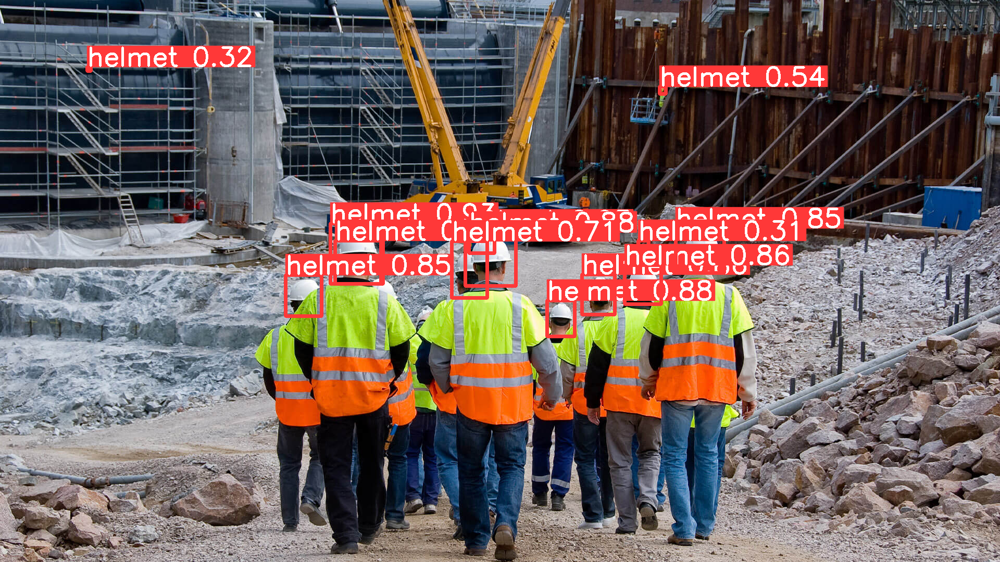

In [ ]:
import os
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction
from IPython.display import Image, display

def display_sliced_image_with_predictions(image_path, detection_model):
    """
    Display an image along with its predictions using sliced prediction.

    Parameters:
        image_path (str): Path to the image file.
        detection_model (AutoDetectionModel): Detection model instance.
    """
    result = get_sliced_prediction(
        image_path,
        detection_model,
        slice_height=256,
        slice_width=256,
        overlap_height_ratio=0.1,
        overlap_width_ratio=0.1
    )
    result.export_visuals(export_dir="demo_data/")
    display(Image("demo_data/prediction_visual.png"))

# Define YOLOv5 model path
yolov5_model_path = '/content/yolov5/runs/train/exp/weights/best.pt'

# Initialize the detection model
detection_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=yolov5_model_path,
    confidence_threshold=0.3,
    device="cpu",  # or 'cuda:0'
)

# Path to the specific image
image_path = '/content/demo_1.jpg'

# Example usage:
display_sliced_image_with_predictions(image_path, detection_model)
